# Project: Advanced Lane Lines

## 1. Camera Calibration
First, I extracted object points and image points by finding the chessboard corners.

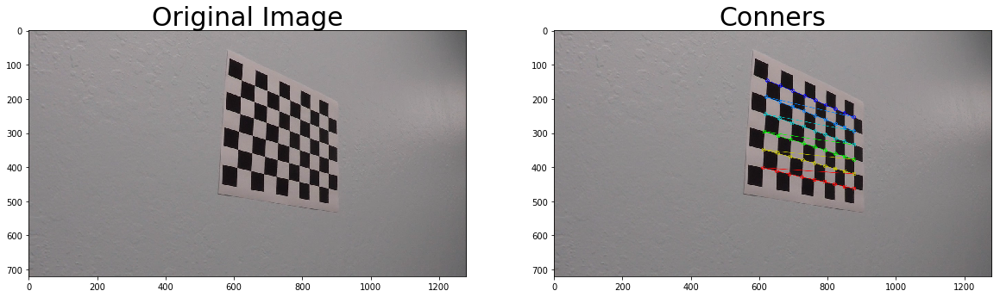

In [23]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline 

#the number of corners
nxc = 9
nyc = 6
# prepare object points, like (0,0,0), (1,0,0), ..., (8,5,0)
objp = np.zeros((nxc*nyc, 3), np.float32)
objp[:,:2] = np.mgrid[0:nxc, 0:nyc].T.reshape(-1,2)
# Array to store object points and image points from all the images
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane

# Make a list of calibration images
images = glob.glob('camera_cal/cal*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # FInd the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nxc,nyc), None)
    # if found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        img_corners = cv2.drawChessboardCorners(img, (nxc, nyc), corners, ret)
        write_name = 'corners_found'+str(idx)+'.jpg'
        cv2.imwrite('camera_cal/'+ write_name, img_corners)
    
    
# Visualize undistortion
img = cv2.imread(fname)
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize = 30)
ax2.imshow(img_corners)
ax2.set_title('Conners', fontsize = 30)


Second, I computed the camera calibration matrix and distortion coefficient with ```objpoints``` and ```imgpoints```, and apply distortion correction on one of the original images.

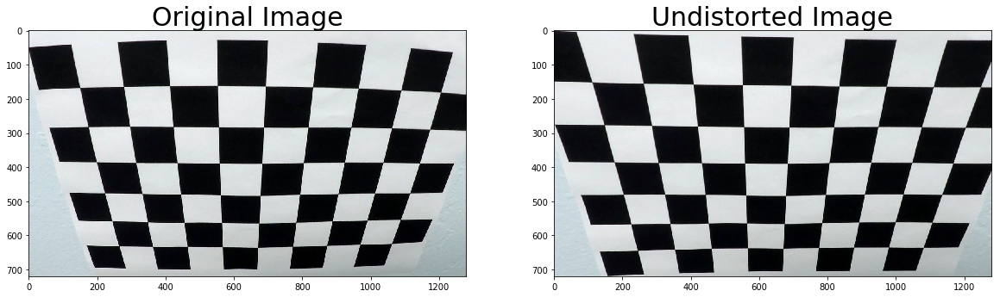

In [24]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

# Import one of the original image to test undistortion on the image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
undst = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize = 30)
ax2.imshow(undst)
ax2.set_title('Undistorted Image', fontsize = 30)
cv2.imwrite('camera_cal/calibration2_undist.jpg', undst)

# Save the camera calibration result for later use
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open('camera_cal/dist_pickle.p', 'wb'))


### 2. Pipeline: Distortion Correction, Thresholding with Color transforms + Gradients, Perspective Transform, 

I will make a pipeline to process each image in the forder, ```test_images``,` with 1) Distortion Correction, 2) Thresholding, and 3) Perspective Transform.

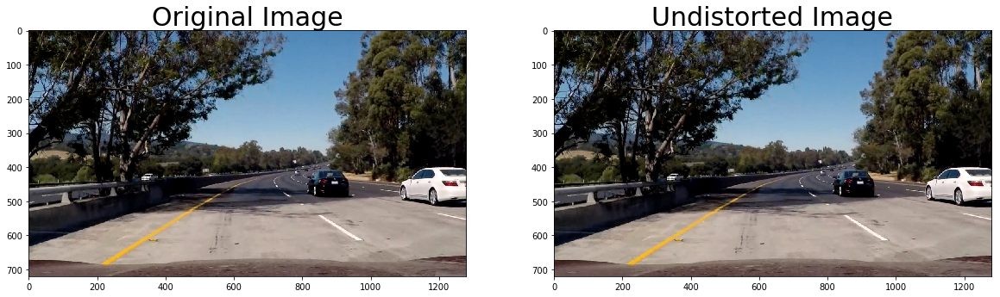

In [438]:
### Distortion Correction

import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read in the saved camera matrix and distortion coeffeictions
dist_pickle = pickle.load(open('camera_cal/dist_pickle.p', 'rb'))
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']

# Read an image in the forder, test_images
img = cv2.imread('test_images/test5.jpg')

# Distortion correction
def distortion_correction(img, mtx, dist):
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    return undst

img_undst = distortion_correction(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize = 30)
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize = 30)



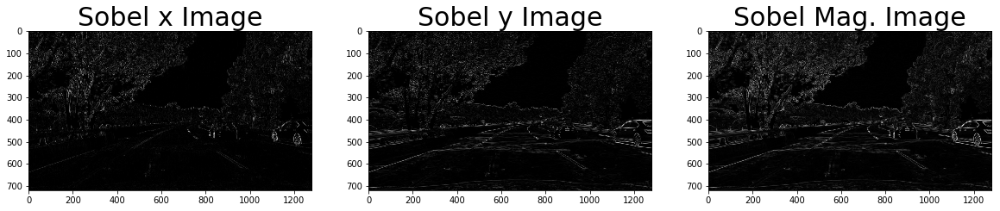

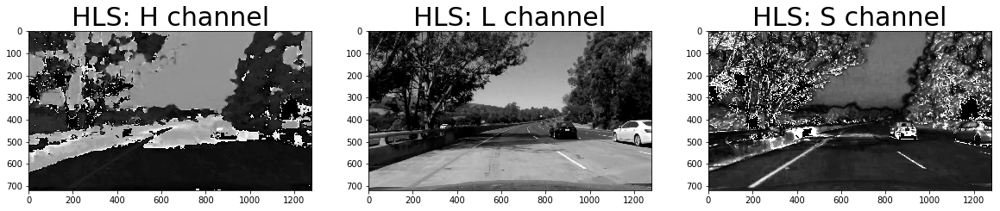

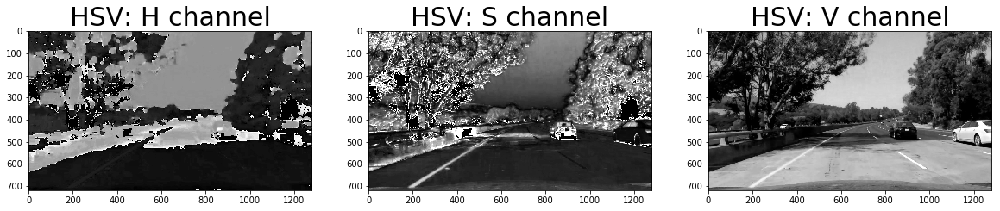

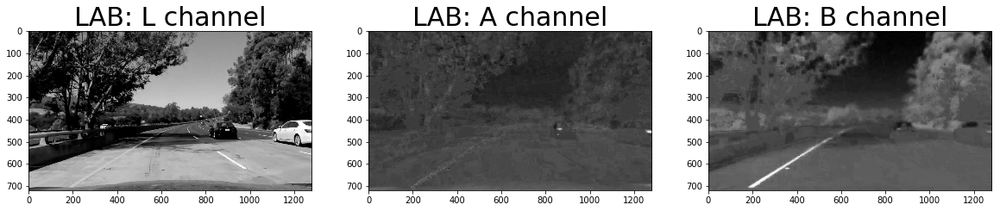

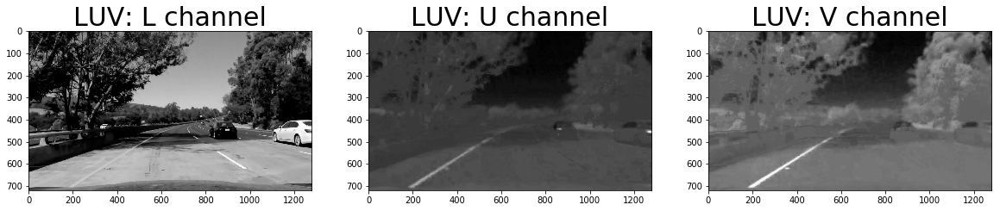

In [474]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def abs_sobel(img, orient='x', sobel_kernel = 3):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the derivative in x or y giein orient
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the derivative
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0-255) then convert to 'np.uint8'
    scaled_sobel = np.uint8(255*abs_sobel / np.max(abs_sobel))
    return scaled_sobel

def mag_sobel(img, sobel_kernel=3):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    gradmag = np.uint8(255*gradmag/np.max(gradmag))
    return gradmag

def HLS_Colors(img):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    return h_channel, l_channel, s_channel

def HSV_Colors(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h_channel = hsv[:,:,0]
    s_channel = hsv[:,:,1]
    v_channel = hsv[:,:,2]
    return h_channel, s_channel, v_channel

def LAB_Colors(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    L_channel = lab[:,:,0]
    A_channel = lab[:,:,1]
    B_channel = lab[:,:,2]
    return L_channel, A_channel, B_channel

def LUV_Colors(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    L_channel = lab[:,:,0]
    U_channel = lab[:,:,1]
    V_channel = lab[:,:,2]
    return L_channel, U_channel, V_channel


sx_result = abs_sobel(img_undst, orient='x', sobel_kernel=3)
sy_result = abs_sobel(img_undst, orient='y', sobel_kernel=3)
mag_result = mag_sobel(img_undst, sobel_kernel=3)

f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (20,10))
ax0.imshow(sx_result, cmap = 'gray')
ax0.set_title('Sobel x Image', fontsize = 30)            
ax1.imshow(sy_result, cmap = 'gray')
ax1.set_title('Sobel y Image', fontsize = 30)    
ax2.imshow(mag_result, cmap = 'gray')
ax2.set_title('Sobel Mag. Image', fontsize = 30)
plt.show()

h_channel, l_channel, s_channel = HLS_Colors(img_undst)
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (20,10))
ax0.imshow(h_channel, cmap = 'gray')
ax0.set_title('HLS: H channel', fontsize = 30)            
ax1.imshow(l_channel, cmap = 'gray')
ax1.set_title('HLS: L channel', fontsize = 30)    
ax2.imshow(s_channel, cmap = 'gray')
ax2.set_title('HLS: S channel', fontsize = 30)
plt.show()

h_channel, s_channel, v_channel = HSV_Colors(img_undst)
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (20,10))
ax0.imshow(h_channel, cmap = 'gray')
ax0.set_title('HSV: H channel', fontsize = 30)            
ax1.imshow(s_channel, cmap = 'gray')
ax1.set_title('HSV: S channel', fontsize = 30)    
ax2.imshow(v_channel, cmap = 'gray')
ax2.set_title('HSV: V channel', fontsize = 30)
plt.show()

L_channel, A_channel, B_channel = LAB_Colors(img_undst)
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (20,10))
ax0.imshow(L_channel, cmap = 'gray')
ax0.set_title('LAB: L channel', fontsize = 30)            
ax1.imshow(A_channel, cmap = 'gray')
ax1.set_title('LAB: A channel', fontsize = 30)    
ax2.imshow(B_channel, cmap = 'gray')
ax2.set_title('LAB: B channel', fontsize = 30)
plt.show()

L_channel, U_channel, V_channel = LUV_Colors(img_undst)
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (20,10))
ax0.imshow(L_channel, cmap = 'gray')
ax0.set_title('LUV: L channel', fontsize = 30)            
ax1.imshow(U_channel, cmap = 'gray')
ax1.set_title('LUV: U channel', fontsize = 30)    
ax2.imshow(V_channel, cmap = 'gray')
ax2.set_title('LUV: V channel', fontsize = 30)
plt.show()




Based on series of the result, I choose Sobel, LAB, HLS spaces to threshold the images for white and yellow lines. 

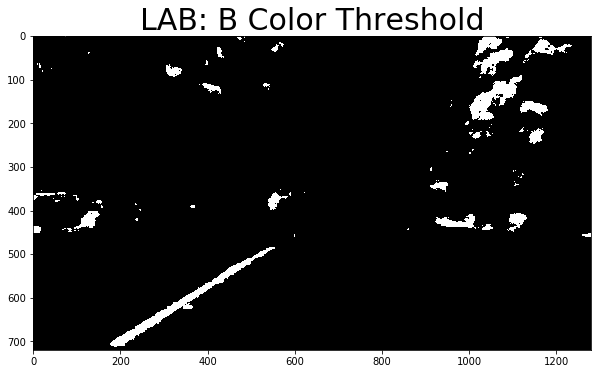

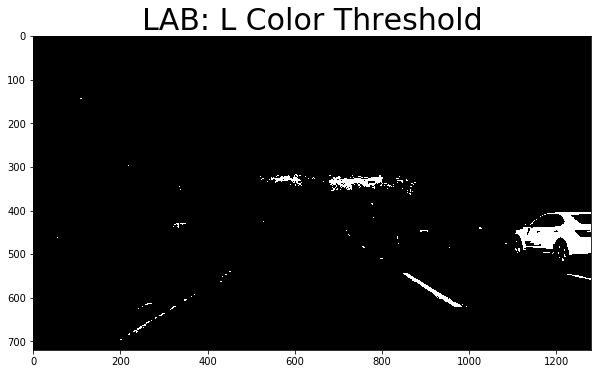

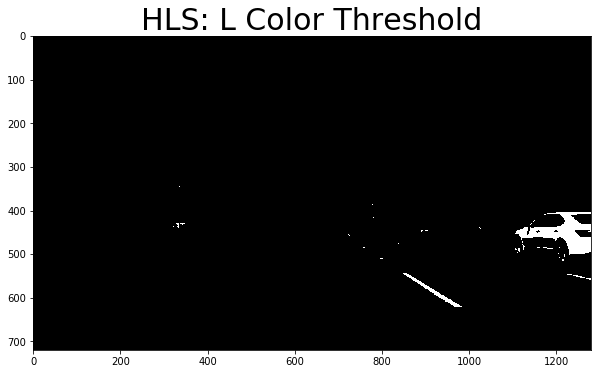

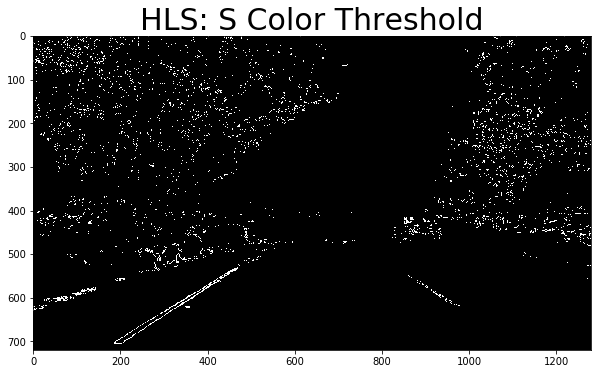

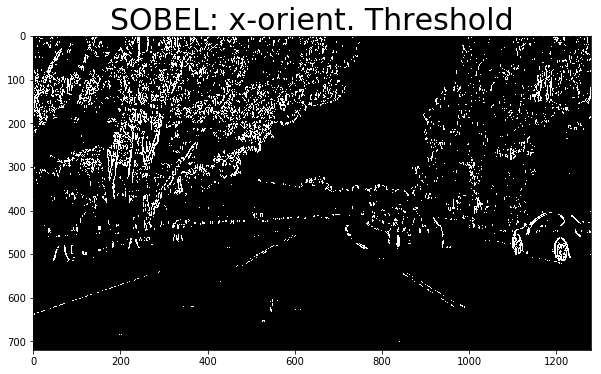

...

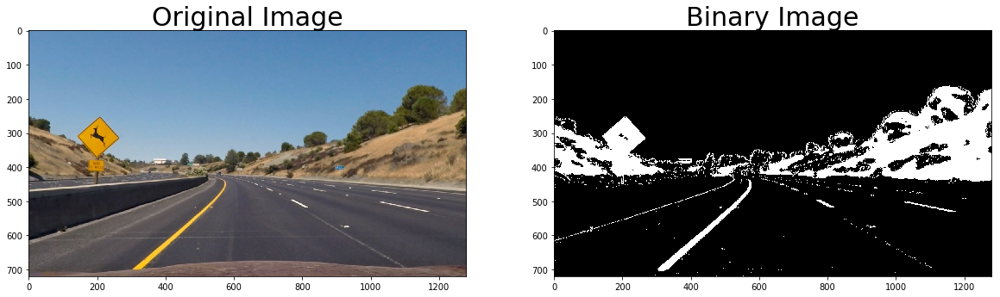

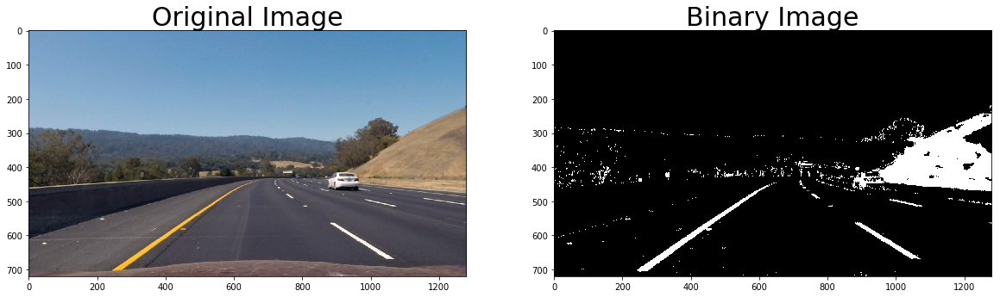

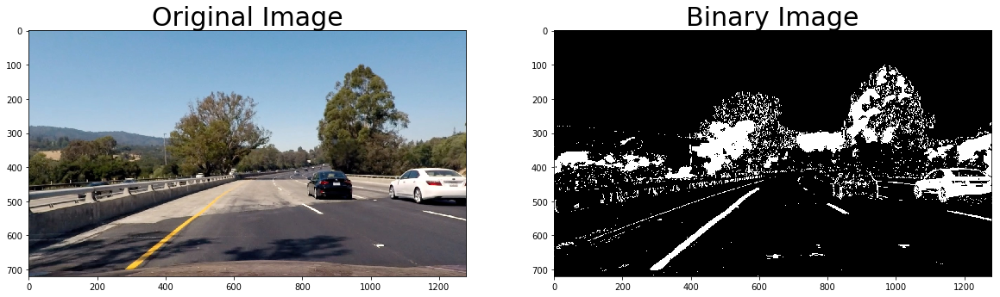

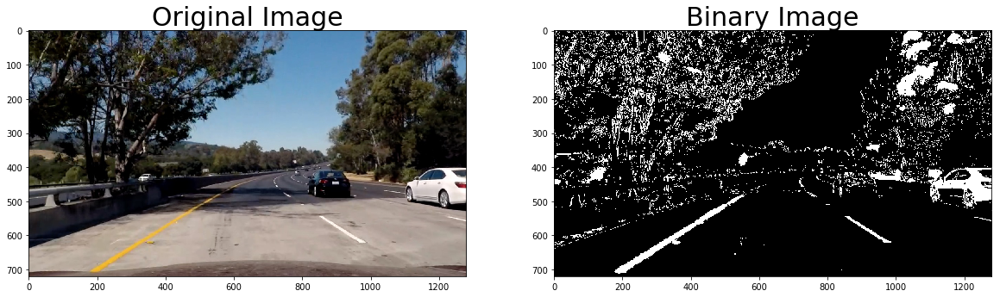

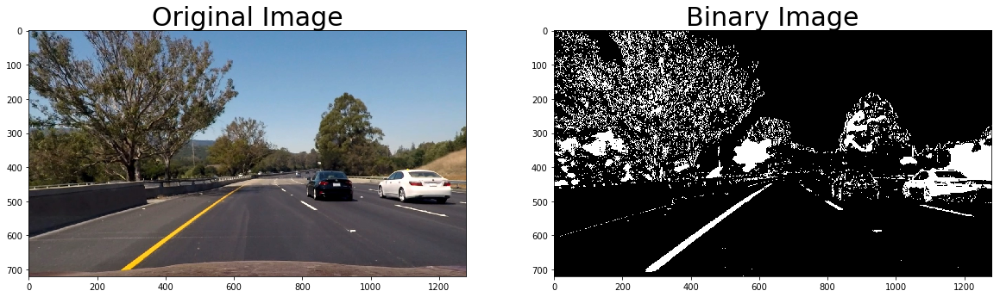

In [828]:
min_LAB_BColor = 145
min_SOBEL_Xo = 30
min_HLS_LColor = 210
min_HLS_SColor = 160
max_HLS_SColor = 200
min_LAB_LColor = 200

# Color thresholding: LAB
def LAB_color_thresh(img, channel = 'l', thresh = (0,255)):
    # 1) Convert to LAB color space and sperate a specific channel
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    if channel == 'l':
        chl = lab[:,:,0]
    elif channel == 'a':
        chl = lab[:,:,1]
    elif channel == 'b':
        chl = lab[:,:,2]
    # 2) Create mask of specific channel whithin each thresholds
    binary = np.zeros_like(img[:,:,0])
    binary[(chl > thresh[0]) & (chl <= thresh[1])] = 1
    return binary

LAB_B_binary = LAB_color_thresh(img_undst, channel = 'b', thresh = (min_LAB_BColor,255))
plt.figure(figsize = (10,10))
plt.imshow(LAB_B_binary, cmap = 'gray')
plt.title('LAB: B Color Threshold', fontsize = 30)
plt.show()

LAB_L_binary = LAB_color_thresh(img_undst, channel = 'l', thresh = (min_LAB_LColor,255))
plt.figure(figsize = (10,10))
plt.imshow(LAB_L_binary, cmap = 'gray')
plt.title('LAB: L Color Threshold', fontsize = 30)
plt.show()

# Color thresholding: HLS
def HLS_color_thresh(img, channel = 'h', thresh = (0,255)):
    # Convert to LAB color space and sperate a specific channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

    if channel == 'h':
        chl = hls[:,:,0]
    elif channel == 'l':
        chl = hls[:,:,1]
    elif channel == 's':
        chl = hls[:,:,2]
    binary = np.zeros_like(img[:,:,0])
    # 2) Create mask of specific channel whithin each thresholds
    binary[(chl > thresh[0]) & (chl <= thresh[1])] = 1
    return binary

HLS_L_binary = HLS_color_thresh(img_undst, channel = 'l', thresh = (min_HLS_LColor,255))
plt.figure(figsize = (10,10))
plt.imshow(HLS_L_binary, cmap = 'gray')
plt.title('HLS: L Color Threshold', fontsize = 30)
plt.show()

HLS_S_binary = HLS_color_thresh(img_undst, channel = 's', thresh = (min_HLS_SColor,max_HLS_SColor))
plt.figure(figsize = (10,10))
plt.imshow(HLS_S_binary, cmap = 'gray')
plt.title('HLS: S Color Threshold', fontsize = 30)
plt.show()

def SOBEL_Mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255
    gradmag = np.uint8(gradmag/scale_factor)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def SOBEL_orient_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel / np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sbinary
    return binary_output

SOBEL_xo_binary = SOBEL_orient_thresh(img_undst, orient='x', sobel_kernel=3, thresh = (min_SOBEL_Xo,255))
plt.figure(figsize = (10,10))
plt.imshow(SOBEL_xo_binary, cmap = 'gray')
plt.title('SOBEL: x-orient. Threshold', fontsize = 30)
plt.show()

def combine_image_or(imga, imgb):
    combined_binary = np.zeros_like(imga)
    combined_binary[(imga == 1) | (imgb == 1)] = 1
    return combined_binary

combine_binary = combine_image_or(LAB_B_binary, HLS_L_binary)    
combine_binary = combine_image_or(combine_binary, HLS_S_binary)    
combine_binary = combine_image_or(combine_binary, SOBEL_xo_binary)    

plt.figure(figsize = (10,10))
plt.imshow(combine_binary, cmap = 'gray')
plt.title('Combined: LAB_B | HLS_L | HLS_S | SOBEL_Mag', fontsize = 30)
plt.show()

# Make a list of test images
images = glob.glob('test_images/test*.jpg')

# Apply the pre-processing on the test images
for idx, fname in enumerate(images):
    # read an image
    img = cv2.imread(fname)
    # undistort the image
    img = distortion_correction(img, mtx, dist)

    # Threshold color spaces
    LAB_B_binary = LAB_color_thresh(img, channel = 'b', thresh = (min_LAB_BColor,255))    
    HLS_L_binary = HLS_color_thresh(img, channel = 'l', thresh = (min_HLS_LColor,255))
    SOBEL_xo_binary = SOBEL_orient_thresh(img, orient='x', sobel_kernel=3, thresh = (min_SOBEL_Xo,255))
    HLS_S_binary = HLS_color_thresh(img, channel = 's', thresh = (min_HLS_SColor,max_HLS_SColor))
    combine_binary = combine_image_or(LAB_B_binary, HLS_L_binary)    
    combine_binary = combine_image_or(combine_binary, HLS_S_binary)    
    combine_binary = combine_image_or(combine_binary, SOBEL_xo_binary)    
       
    f, (ax0, ax1) = plt.subplots(1, 2, figsize = (20,10))
    ax0.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    ax0.set_title('Original Image', fontsize = 30)            

    ax1.imshow(combine_binary, cmap = 'gray')
    ax1.set_title('Binary Image', fontsize = 30)
    write_name = 'test_images/tracked'+str(idx)+'.jpg'
    cv2.imwrite(write_name, combine_binary)

I found a post relating color threholdings with finding traffic lane lines. I refered this code, it utilized "cv2.inRange". But, I did not use it because it could not detect lanes far away.

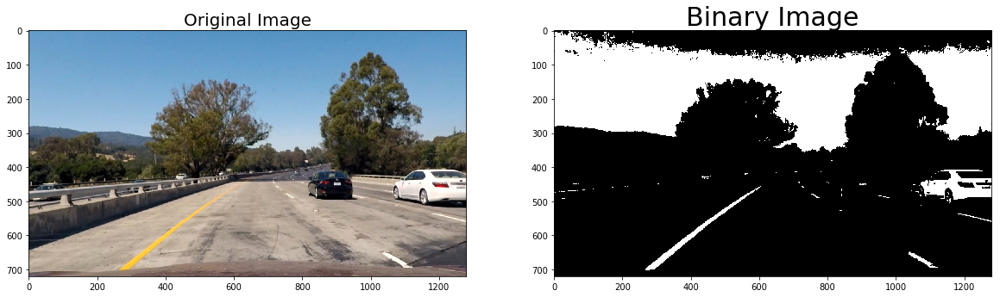

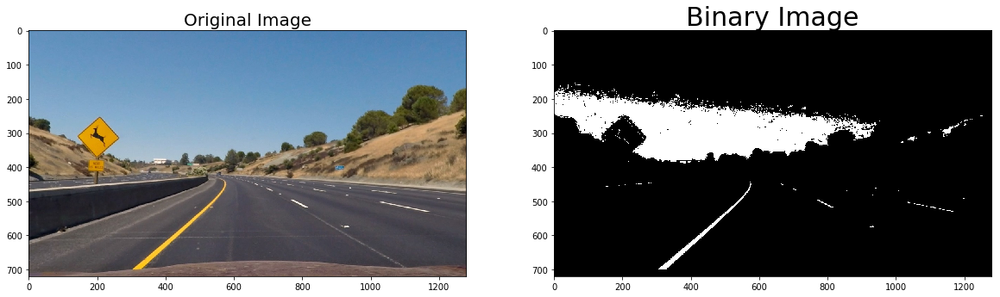

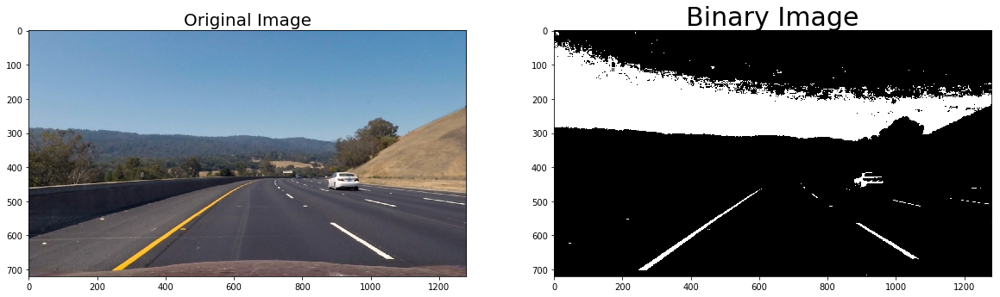

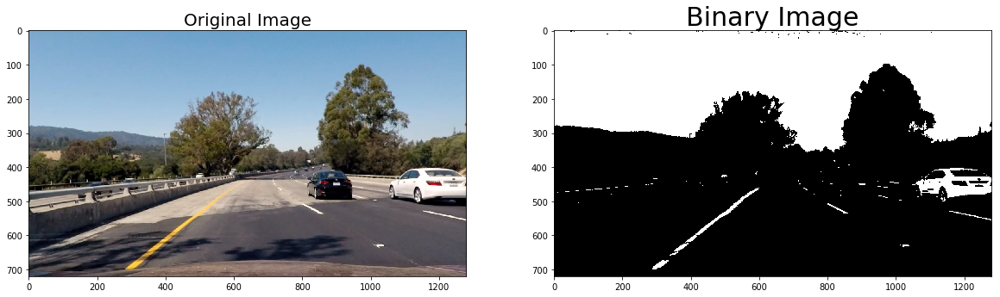

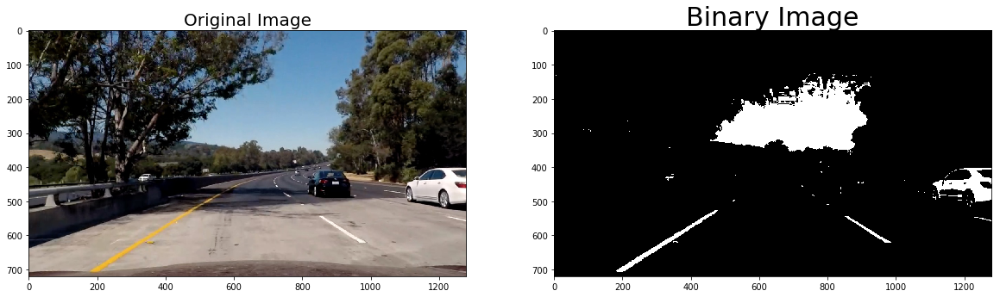

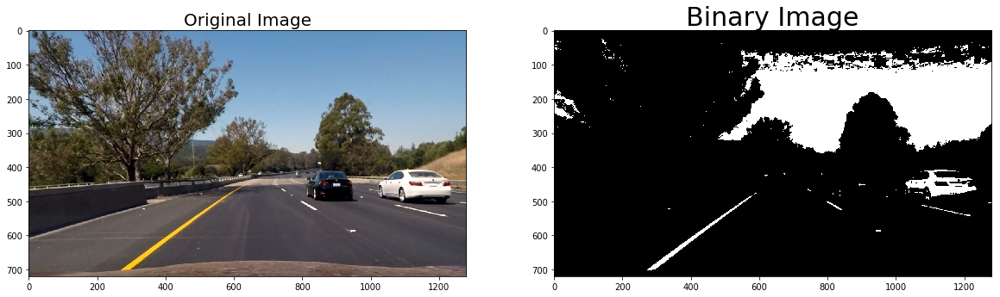

In [610]:
def thresh_bin_im(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    """
    Return the colour thresholds binary for L, S and R channels in an image: RGB image
    Ref: https://medium.com/@tjosh.owoyemi/finding-lane-lines-with-colour-thresholds-beb542e0d839
    """
    def bin_it(image, threshold):
        output_bin = np.zeros_like(image)
        output_bin[(image >=threshold[0]) & (image <= threshold[1])] = 1
        return output_bin
    
    # convert image to hls colour space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
    
    # binary threshold values
    bin_thresh = [20,255]
    
    # rgb thresholding for "yello"
    lower = np.array([255,180, 0], dtype ="uint8")
    upper = np.array([255,255, 170], dtype ="uint8")
    mask = cv2.inRange(image, lower, upper)
    rgb_y = cv2.bitwise_and(image, image, mask = mask).astype(np.uint8)
    rgb_y = cv2.cvtColor(rgb_y, cv2.COLOR_RGB2GRAY)
    rgb_y = bin_it(rgb_y, bin_thresh)
    
    # rgb thresholding for white (best)
    lower = np.array([100,100,200], dtype = "uint8")
    upper = np.array([255,255,255], dtype = "uint8")
    mask = cv2.inRange(image, lower, upper)
    rgb_w = cv2.bitwise_and(image, image, mask = mask).astype(np.uint8)
    rgb_w = cv2.cvtColor(rgb_w, cv2.COLOR_RGB2GRAY)
    rgb_w = bin_it(rgb_w, bin_thresh)
    
    # hls thresholding for yellow
    lower = np.array([15,127,127], dtype = "uint8")
    upper = np.array([25,200,255], dtype = "uint8")
    mask = cv2.inRange(hls, lower, upper)
    hls_y = cv2.bitwise_and(image, image, mask = mask).astype(np.uint8)
    hls_y = cv2.cvtColor(hls_y, cv2.COLOR_HLS2RGB)
    hls_y = cv2.cvtColor(hls_y, cv2.COLOR_RGB2GRAY)
    hls_y = bin_it(hls_y, bin_thresh)
    
    im_bin = np.zeros_like(hls_y)
    im_bin[(hls_y==1)|(rgb_y==1)|(rgb_w==1)]=1
    
    return im_bin

# Make a list of test images
images = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    # read an image
    img = cv2.imread(fname)
    # undistort the image
    img = distortion_correction(img, mtx, dist)
    
    combine_binary = thresh_bin_im(img)

       
    f, (ax0, ax1) = plt.subplots(1, 2, figsize = (20,10))
    ax0.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    ax0.set_title('Original Image', fontsize = 20)            
#     ax1.imshow(combined_binary2)
#     ax1.set_title('Color_Binary Image', fontsize = 30)    
    ax1.imshow(combine_binary, cmap = 'gray')
    ax1.set_title('Binary Image', fontsize = 30)
    write_name = 'test_images/tracked'+str(idx)+'.jpg'
    cv2.imwrite(write_name, combine_binary)
    plt.show()

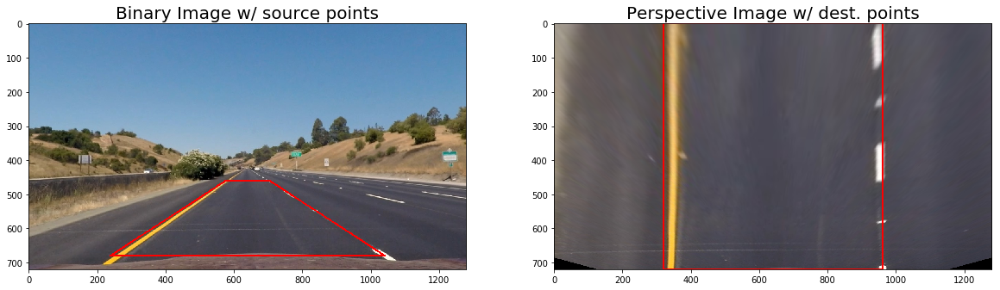

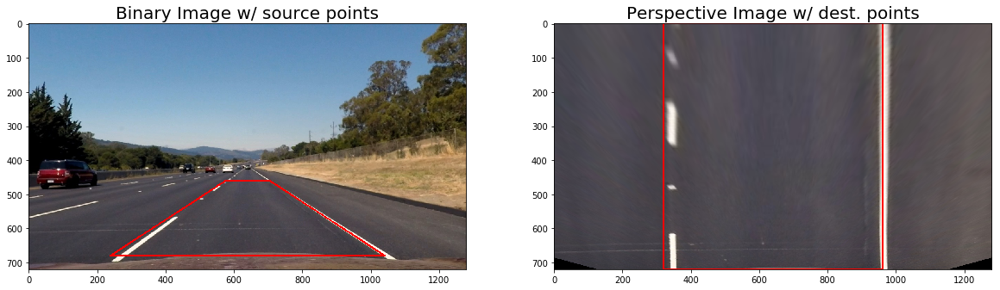

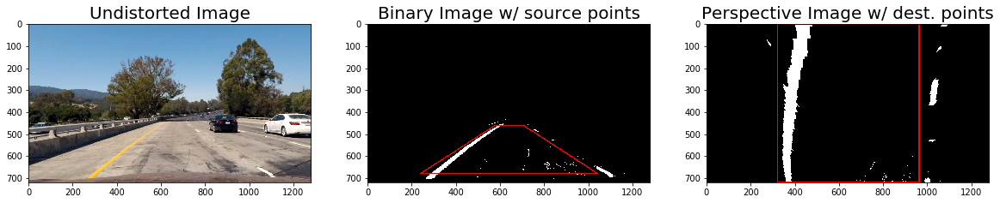

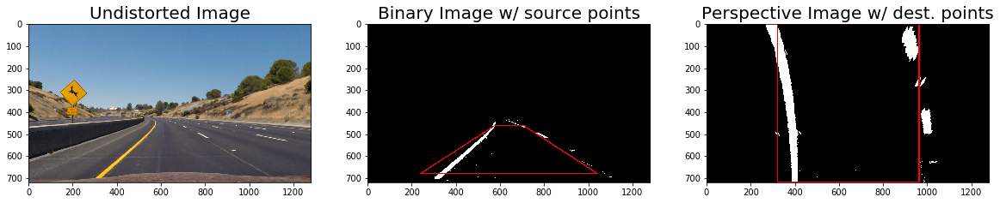

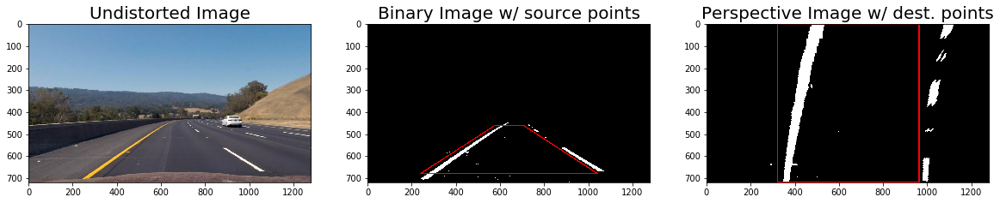

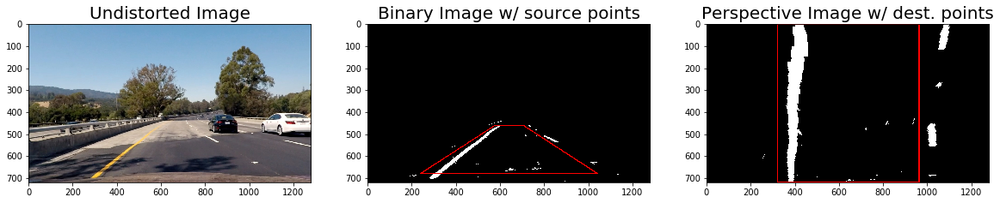

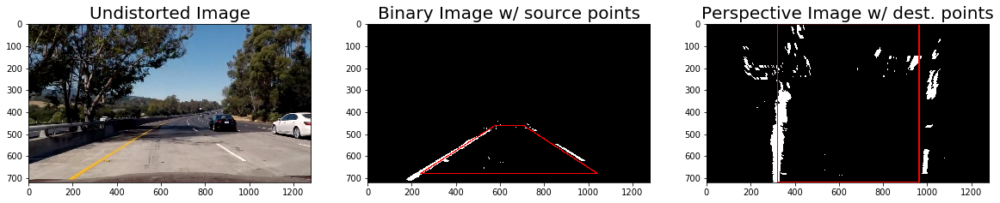

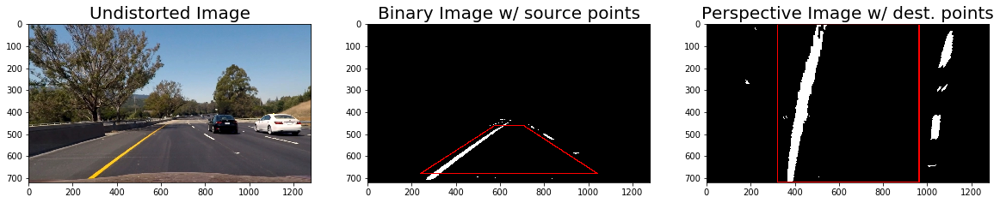

In [829]:
### Perspective Transform

# take source points as the trapazoidal vertices
src = np.float32([[(img_size[0] / 2) - 64, img_size[1] / 2 + 100],
                  [((img_size[0] / 6) + 25), img_size[1] - 40],
                  [(img_size[0] * 5 / 6) - 25, img_size[1] - 40],
                  [(img_size[0] / 2 + 64), img_size[1] / 2 + 100]]) 

# take source points as the rectangular vertices
dst = np.float32([[(img_size[0] / 4), 0],[(img_size[0] / 4), img_size[1]],
                  [(img_size[0] * 3 / 4), img_size[1]],[(img_size[0] * 3 / 4), 0]])


def region_of_interest(img):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    # Masking with polygon 
    imshape = img.shape
    vertices = np.array([[(20,imshape[0]),
                          (int(imshape[1]*0.47), int(imshape[0]*0.6)), 
                          (int(imshape[1]*0.53), int(imshape[0]*0.6)), 
                          (imshape[1]-20,imshape[0])]])     
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image
        


def perspectiveTransform(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    # Compute the perspective transform, M, Minv
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp an image using the perspective transform
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    return warped, Minv

# TEST 1: straight lines image1
img = cv2.imread('test_images/straight_lines1.jpg')
img = distortion_correction(img, mtx, dist)
warped, Minv = perspectiveTransform(img, src, dst)
# Visualtization with source and destination points
cv2.polylines(img, np.int32([src]), 1, (0,0,255), thickness=3)
cv2.polylines(warped, np.int32([dst]), 1, (0,0,255), thickness=3)    

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))       
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Binary Image w/ source points', fontsize = 20)    
ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
ax2.set_title('Perspective Image w/ dest. points', fontsize = 20)

# TEST 2: straight lines image2
img = cv2.imread('test_images/straight_lines2.jpg')
img = distortion_correction(img, mtx, dist)
warped, Minv = perspectiveTransform(img, src, dst)
# Visualtization with source and destination points
cv2.polylines(img, np.int32([src]), 1, (0,0,255), thickness=3)
cv2.polylines(warped, np.int32([dst]), 1, (0,0,255), thickness=3)    

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))     
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Binary Image w/ source points', fontsize = 20)    
ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
ax2.set_title('Perspective Image w/ dest. points', fontsize = 20)



# Define the complete image processing pipeline, reads raw image and returns binary image with lane lines identified
def pipeline(img):
    img = distortion_correction(img, mtx, dist)
    
    # Color & Derivative thresholding
    LAB_B_binary = LAB_color_thresh(img, channel = 'b', thresh = (min_LAB_BColor,255))    
    HLS_L_binary = HLS_color_thresh(img, channel = 'l', thresh = (min_HLS_LColor,255))
    SOBEL_xo_binary = SOBEL_orient_thresh(img, orient='x', sobel_kernel=3, thresh = (min_SOBEL_Xo,255))
    HLS_S_binary = HLS_color_thresh(img, channel = 's', thresh = (min_HLS_SColor,max_HLS_SColor))
    combine_binary = combine_image_or(LAB_B_binary, HLS_L_binary)    
    combine_binary = combine_image_or(combine_binary, HLS_S_binary)            
    combine_binary = combine_image_or(combine_binary, SOBEL_xo_binary)        

    # Mask
    combine_binary = region_of_interest(combine_binary)    
    
    # Perspective Transform
    warped, Minv = perspectiveTransform(combine_binary, src, dst)
    return warped, Minv

# Make a list of test images
images = glob.glob('test_images/test*.jpg')

# Apply the pre-processing on the test images
for idx, fname in enumerate(images):
    # read an image
    img = cv2.imread(fname)
    # undistort the image
    img = distortion_correction(img, mtx, dist)    
    
    # Color & Derivative thresholding
    LAB_B_binary = LAB_color_thresh(img, channel = 'b', thresh = (min_LAB_BColor,255))    
    HLS_L_binary = HLS_color_thresh(img, channel = 'l', thresh = (min_HLS_LColor,255))
    SOBEL_xo_binary = SOBEL_orient_thresh(img, orient='x', sobel_kernel=3, thresh = (min_SOBEL_Xo,255))
    HLS_S_binary = HLS_color_thresh(img, channel = 's', thresh = (min_HLS_SColor,max_HLS_SColor))
    combine_binary = combine_image_or(LAB_B_binary, HLS_L_binary)    
    combine_binary = combine_image_or(combine_binary, HLS_S_binary)    
    combine_binary = combine_image_or(combine_binary, SOBEL_xo_binary)
    
    # Mask
    combine_binary = region_of_interest(combine_binary)
    
    # Perspective Transfom
    warped, Minv = perspectiveTransform(combine_binary, src, dst)
    
    # Visualtization with source and destination points
    out_img = np.dstack((combine_binary, combine_binary, combine_binary))*255
    cv2.polylines(out_img, np.int32([src]), 1, (255,0,0), thickness=3)
    
    out_img2 = np.dstack((warped, warped, warped))*255
    cv2.polylines(out_img2, np.int32([dst]), 1, (255,0,0), thickness=3)    
    
    f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (20,10))
    ax0.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax0.set_title('Undistorted Image', fontsize = 20)        
    ax1.imshow(out_img, cmap = 'gray')
    ax1.set_title('Binary Image w/ source points', fontsize = 20)    
    ax2.imshow(out_img2, cmap = 'gray')
    ax2.set_title('Perspective Image w/ dest. points', fontsize = 20)
    
    write_name = 'test_images/tracked'+str(idx)+'.jpg'
    cv2.imwrite(write_name, warped*255)
    

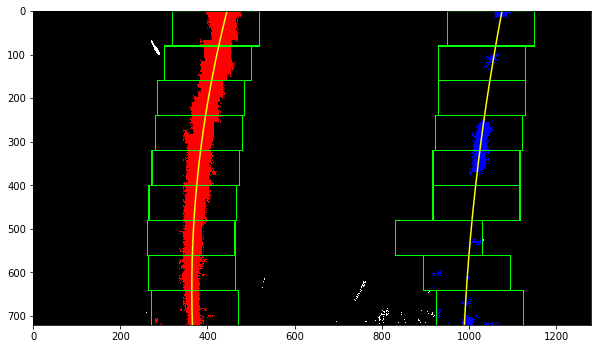

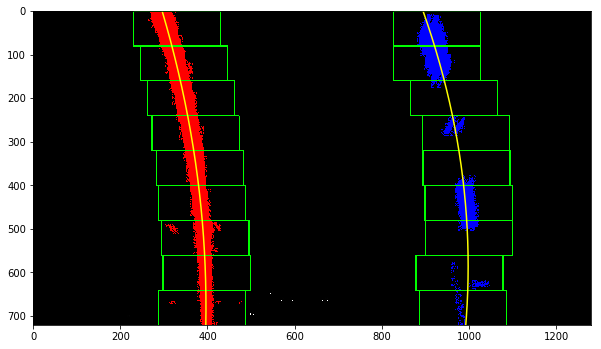

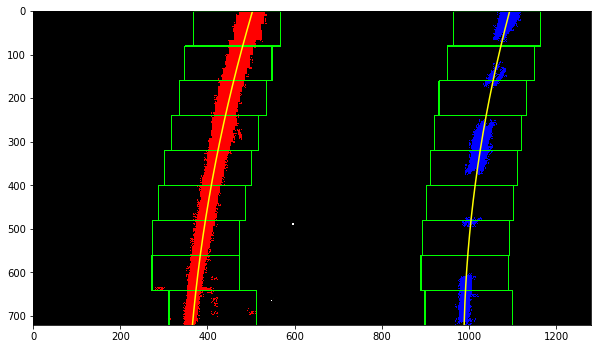

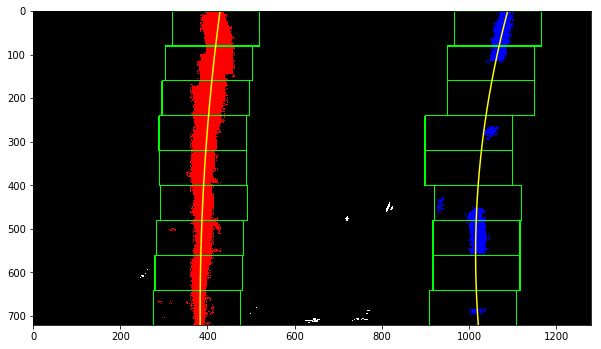

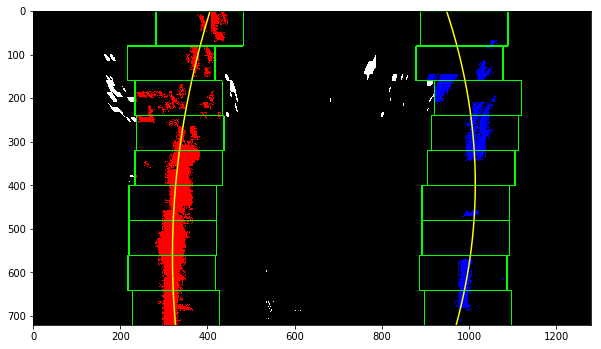

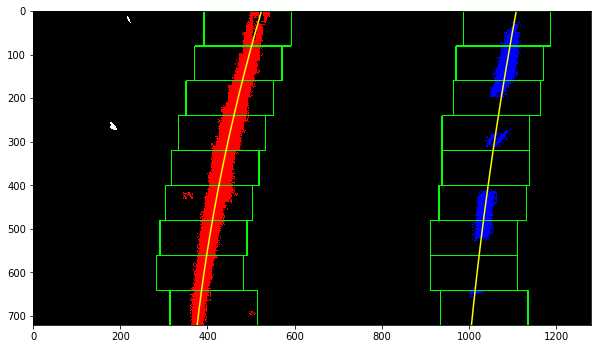

In [612]:
### Fitting a polynomial (Sliding Windows Search)
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob 

# Define method to fit polynomial to binary image with lines extracted, using sliding window
def sliding_window_polyfit(img):
    # Take a histogram of the bottom third of the image
    histogram = np.sum(img[img.shape[0]//3:, :], axis=0)
    
    # Find the peak of the left and right haves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty list to receive left and right lane pixel indices and windows vertices
    left_lane_inds = []
    right_lane_inds = []
    windows_data = []    
    
    ### Step through the windows one by one
    for window in range(nwindows):
        # Idetify window boundaries in x and y (for right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        windows_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))                
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)
                          & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]        
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)
                          & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixcels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:            
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]  
    # Fit a second order polynomial to each
    if len(lefty)*len(leftx) != 0 :
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        left_fit = None
        
    if len(righty)*len(rightx) != 0 :
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        right_fit = None

    return left_fit, right_fit, left_lane_inds, right_lane_inds, windows_data
    

# Choose the numbe of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

images = glob.glob('test_images/tracked*.jpg')
# Apply the pre-processing on the test images
for idx, fname in enumerate(images):   

    # read an image as binary
    binary_warped = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2GRAY)
    left_fit, right_fit, left_lane_inds, right_lane_inds, windows_data = sliding_window_polyfit(binary_warped)

    ### Visualization  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])    
    
    # Create an output image to draw on and visualize the result
    out_image = np.dstack((binary_warped, binary_warped, binary_warped))   
    
    # Color left and right lane lines
    out_image[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255,0,0]
    out_image[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0,0,255]       

    # Draw the windows on the visualization image    
    for win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high in windows_data:

        cv2.rectangle(out_image, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high)
                      ,(0,255,0),2)
        cv2.rectangle(out_image, (win_xright_low, win_y_low), (win_xright_high, win_y_high)
                      ,(0,255,0),2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    plt.figure(figsize = (10,10))    
    plt.imshow(out_image)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0,1280)
    plt.ylim(720,0) 
    plt.show()
    
        
        

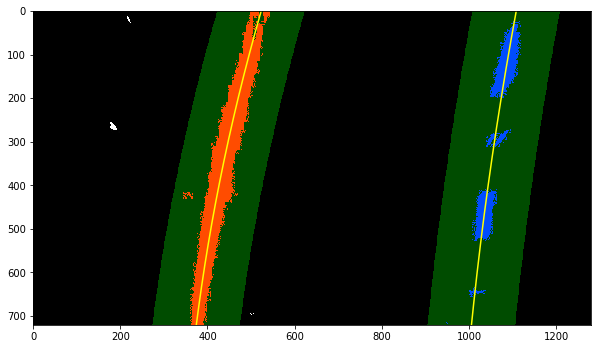

In [830]:
### Skip the sliding windows step once you know where the lines are
# From the next frame of video, It's much easier to find line pixels!
# Identify the x and y positions of all nonzero pixels in the image    

def polyfit_with_previous(img, left_fit_prev, right_fit_prev):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    margin = 100

    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) &
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) &
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))
    # Again, extract left and right line pixel position
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit, left_lane_inds, right_lane_inds
    
left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_with_previous(binary_warped, left_fit, right_fit)

### Visualization
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Create an image to draw on the an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window are "a"
# And recast the x and y points into usuable format for cv2.fillpoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255,0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255,0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.figure(figsize = (10,10))    
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0,binary_warped.shape[1])
plt.ylim(binary_warped.shape[0],0)
plt.show()

    

In [655]:
### Curvature & Distance form center
def cal_Curvature_CenterDist(left_fit, right_fit):
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = img.shape[0]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    
    left_fit_cr = np.zeros_like(left_fit)
    left_fit_cr[0] = left_fit[0]/ym_per_pix**2*xm_per_pix
    left_fit_cr[1] = left_fit[1]/ym_per_pix*xm_per_pix
    left_fit_cr[2] = left_fit[2]*xm_per_pix

    right_fit_cr = np.zeros_like(right_fit)
    right_fit_cr[0] = right_fit[0]/ym_per_pix**2*xm_per_pix
    right_fit_cr[1] = right_fit[1]/ym_per_pix*xm_per_pix
    right_fit_cr[2] = right_fit[2]*xm_per_pix



    # Calculate the new rad. of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*(y_eval*ym_per_pix) + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*(y_eval*ym_per_pix) + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Now our radius of curvature is in meters
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
#     if left_fitx is not None and right_fitx is not None:
    car_position = binary_warped.shape[1]/2
    left_fitx_y_eval = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_fitx_y_eval = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    lane_center_position = (left_fitx_y_eval + right_fitx_y_eval) /2
    center_dist = (car_position - lane_center_position) * xm_per_pix
       
    return left_curverad, right_curverad, center_dist

left_curverad, right_curverad, center_dist = cal_Curvature_CenterDist(left_fit, right_fit)

print(left_curverad, 'm', right_curverad, 'm')
print(center_dist, 'm')


429.164477842 m 821.573313011 m
-0.490183124674 m


In [817]:
### Define Line Class
class line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = []
        # average x values of the fitted line over the last n iterations
        self.bestx = None
        # polynomial coeffeicents averaged over the last n iterations
        self.best_fit = None
        # polynomial coefficients for the most recent fit
        self.current_fit = []
        # radius of curvature of the line in some units
        self.radius_of_curvature = None
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        # x values for detected line pixels
        self.allx = None
        # y values for detected line pixels
        self.ally = None
        
    def add_fit(self, fit, inds):
        n = 5 # the number of newesst fits kept in the class
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                #  If we have a previous best fit, see how this new fit compares
                self.diffs = abs(fit - self.best_fit)
                
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                print("ERROR4: Big GAP!!!!.")                
                # bad fit! abort!!!!!! 
                self.detected = False
                self.current_fit = self.current_fit[1:len(self.current_fit)]
                if len(self.current_fit) > 0:
                    # if there are still any fits in the queue, best_fit is their average
                    self.best_fit = np.average(self.current_fit, axis=0)
                else:
                    # if not best_fit is fit.
                    self.best_fit = fit

            else:
                
                self.detected = True
                self.current_fit.append(fit)
                if len(self.current_fit) > n:
                    # throw out oldest fit, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-n:]
                self.best_fit = np.average(self.current_fit, axis=0)
                
        # or remove one from the history if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit and preserve the previous best_fit.
                print('ERROR5: fit None')
                self.current_fit = self.current_fit[1:len(self.current_fit)]

In [818]:
def draw_lane(original_img, binary_img, left_fit, right_fit, Minv):
    new_img = np.copy(original_img)
    if left_fit is None or right_fit is None:
        return original_img
    # Create an image to draw lane lines
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h, w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h) # to cover smae y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillpoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto thw warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(0,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(255,0,0), thickness=15)
    
    # Warp the black back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h))
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)

    return result

def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curv. radius: ' + '{:7.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40, 70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40, 120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

def draw_data2(original_img, left_line, right_line):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'L. detected: ' + str(left_line.detected)
    cv2.putText(new_img, text, (40, 170), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    text = 'R. detected: ' + str(right_line.detected)
    cv2.putText(new_img, text, (40, 220), font, 1.5, (200,255,155), 2, cv2.LINE_AA)            

    
    if len(left_line.best_fit) > 0:
        text = 'L. Best fit: ' + '{:04.2f}'.format(left_line.best_fit[0]) + ' ' + '{:04.2f}'.format(left_line.best_fit[1]) + ' ' + '{:04.2f}'.format(left_line.best_fit[2])
    else:
        text = 'L. Best fit: None'
    cv2.putText(new_img, text, (500, 170), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    if len(right_line.best_fit) > 0:
        text = 'R. Best fit: ' + '{:04.2f}'.format(right_line.best_fit[0]) + ' ' + '{:04.2f}'.format(right_line.best_fit[1]) + ' ' + '{:04.2f}'.format(right_line.best_fit[2])
    else:
        text = 'R. Best fit: None'    
    cv2.putText(new_img, text, (500, 220), font, 1.5, (200,255,155), 2, cv2.LINE_AA)        
    
    
    return new_img



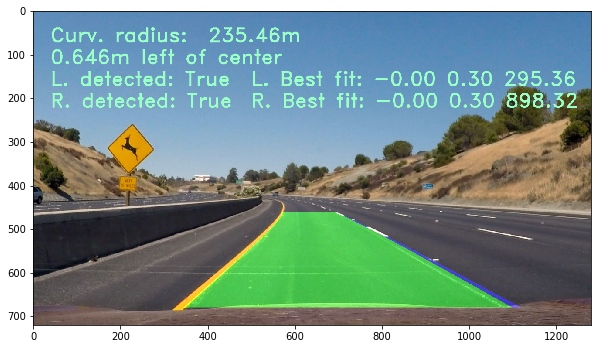

In [831]:
r_line = line()
l_line = line()
def processing_image(img):
    new_img = np.copy(img)
    
    binary_warped, Minv = pipeline(new_img)
    
    # if both left and right lane is detected in the last frame, use "polyfit_with_previous"
    # , or "sliding_window_polyfit"
    if not r_line.detected or not l_line.detected:
        left_fit, right_fit, left_lane_inds, right_lane_inds, windows_data = sliding_window_polyfit(binary_warped)
    else:
        left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_with_previous(binary_warped, l_line.best_fit, r_line.best_fit)

    # invalidate both fits if the difference in their x-intercepts isn't around 600 px (+/- 100 px)
    if left_fit is not None and right_fit is not None:
        # Calculate the x-intercept at the bootom of image
        h = img.shape[0]
        left_fitx_h = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fitx_h = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        
        x_diff = abs(right_fitx_h - left_fitx_h)
        if abs(600 - x_diff) > 100:
            left_fit = None
            right_fit = None
            print("ERROR1: left_fit & right_fit => None")
    else:
        print("ERROR2: left_fit & right_fit == None")
    
    l_line.add_fit(left_fit, left_lane_inds)
    r_line.add_fit(right_fit, right_lane_inds)
    
    # Draw lane and data of the best fit
    if l_line.best_fit is not None and r_line.best_fit is not None:
        draw_lane_img = draw_lane(new_img, binary_warped, l_line.best_fit, r_line.best_fit, Minv)
        left_curverad, right_curverad, center_dist = cal_Curvature_CenterDist(l_line.best_fit, r_line.best_fit)
        img_out = draw_data(draw_lane_img, (left_curverad+right_curverad)/2, center_dist)
        img_out = draw_data2(img_out, l_line, r_line)
        return img_out
    
    else:    
        print("ERROR3: left_best_fit | right_best_fit == None")
        return img_out

original_img = cv2.imread('test_images/test2.jpg')
img_out = processing_image(original_img)
plt.figure(figsize = (10,10))    
plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
plt.show()
       
    

    

In [820]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

l_line = line()
r_line = line()

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#|.subclip(20,25)
processed_video = video_input1.fl_image(processing_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



 12%|█▏        | 152/1261 [00:22<02:44,  6.75it/s]


 24%|██▍       | 303/1261 [00:44<02:15,  7.06it/s]


 36%|███▌      | 454/1261 [01:05<01:57,  6.84it/s]


 43%|████▎     | 547/1261 [01:19<01:43,  6.87it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 44%|████▎     | 549/1261 [01:20<01:43,  6.86it/s]

ERROR4: Big GAP!!!!.



 56%|█████▌    | 700/1261 [01:41<01:18,  7.12it/s]


 67%|██████▋   | 851/1261 [02:02<00:57,  7.15it/s]


 79%|███████▉  | 1002/1261 [02:23<00:33,  7.65it/s]


 82%|████████▏ | 1034/1261 [02:28<00:31,  7.22it/s]

ERROR4: Big GAP!!!!.



 82%|████████▏ | 1039/1261 [02:28<00:31,  7.11it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 83%|████████▎ | 1041/1261 [02:29<00:31,  7.09it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 94%|█████████▍| 1189/1261 [02:50<00:10,  6.97it/s]


100%|█████████▉| 1260/1261 [03:00<00:00,  7.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 4min 14s, sys: 49.9 s, total: 5min 4s
Wall time: 3min 1s


In [821]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(video_output1))

In [824]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

l_line = line()
r_line = line()

video_output2 = 'challenge_video_output.mp4'
video_input2 = VideoFileClip('challenge_video.mp4')#.subclip(0,10)
processed_video2 = video_input2.fl_image(processing_image)
%time processed_video2.write_videofile(video_output2, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4



  5%|▌         | 26/485 [00:03<00:59,  7.66it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  6%|▌         | 28/485 [00:03<01:00,  7.59it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  6%|▌         | 30/485 [00:04<00:58,  7.83it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  7%|▋         | 32/485 [00:04<00:57,  7.86it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 10%|█         | 49/485 [00:06<00:57,  7.61it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 11%|█         | 51/485 [00:06<00:57,  7.56it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 11%|█         | 53/485 [00:07<00:59,  7.21it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 11%|█▏        | 55/485 [00:07<00:58,  7.29it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 12%|█▏        | 57/485 [00:07<00:58,  7.31it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 12%|█▏        | 59/485 [00:07<00:57,  7.39it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 13%|█▎        | 61/485 [00:08<00:58,  7.22it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 13%|█▎        | 63/485 [00:08<00:57,  7.35it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 13%|█▎        | 65/485 [00:08<00:56,  7.45it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 14%|█▍        | 67/485 [00:08<00:56,  7.44it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 14%|█▍        | 69/485 [00:09<00:55,  7.45it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 15%|█▍        | 71/485 [00:09<00:55,  7.52it/s]

ERROR1: left_fit & right_fit => None



 23%|██▎       | 111/485 [00:14<00:46,  7.98it/s]

ERROR4: Big GAP!!!!.



 23%|██▎       | 113/485 [00:15<00:46,  7.96it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 24%|██▎       | 115/485 [00:15<00:47,  7.86it/s]

ERROR4: Big GAP!!!!.



 24%|██▍       | 118/485 [00:15<00:46,  7.94it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 25%|██▍       | 120/485 [00:16<00:48,  7.52it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.



 25%|██▌       | 122/485 [00:16<00:46,  7.76it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 26%|██▌       | 124/485 [00:16<00:47,  7.54it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 26%|██▌       | 127/485 [00:17<00:46,  7.71it/s]

ERROR4: Big GAP!!!!.



 27%|██▋       | 129/485 [00:17<00:45,  7.77it/s]

ERROR4: Big GAP!!!!.



 27%|██▋       | 131/485 [00:17<00:47,  7.50it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 27%|██▋       | 133/485 [00:17<00:45,  7.79it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 28%|██▊       | 135/485 [00:18<00:44,  7.90it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 28%|██▊       | 137/485 [00:18<00:48,  7.17it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 60%|██████    | 291/485 [00:39<00:26,  7.41it/s]


 87%|████████▋ | 423/485 [00:58<00:09,  6.77it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 88%|████████▊ | 425/485 [00:58<00:08,  7.04it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 88%|████████▊ | 427/485 [00:58<00:08,  7.22it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 429/485 [00:59<00:07,  7.18it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 89%|████████▉ | 431/485 [00:59<00:07,  7.29it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 89%|████████▉ | 433/485 [00:59<00:07,  7.04it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 90%|████████▉ | 435/485 [00:59<00:07,  7.01it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 90%|█████████ | 437/485 [01:00<00:06,  6.92it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 91%|█████████ | 439/485 [01:00<00:06,  6.92it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 91%|█████████ | 441/485 [01:00<00:06,  7.17it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 91%|█████████▏| 443/485 [01:00<00:05,  7.33it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 445/485 [01:01<00:05,  7.42it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 447/485 [01:01<00:05,  7.41it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 93%|█████████▎| 449/485 [01:01<00:05,  7.14it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 93%|█████████▎| 451/485 [01:02<00:05,  6.54it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 93%|█████████▎| 453/485 [01:02<00:04,  6.41it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▍| 455/485 [01:02<00:04,  6.52it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▍| 457/485 [01:03<00:04,  6.70it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 95%|█████████▍| 459/485 [01:03<00:03,  6.78it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 96%|█████████▋| 467/485 [01:04<00:02,  7.63it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 97%|█████████▋| 472/485 [01:05<00:01,  7.60it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 98%|█████████▊| 474/485 [01:05<00:01,  7.56it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 98%|█████████▊| 476/485 [01:05<00:01,  7.70it/s]

ERROR4: Big GAP!!!!.



 99%|█████████▉| 481/485 [01:06<00:00,  7.62it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



100%|█████████▉| 483/485 [01:06<00:00,  7.64it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



100%|██████████| 485/485 [01:06<00:00,  7.68it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 36s, sys: 16.6 s, total: 1min 52s
Wall time: 1min 7s


In [825]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(video_output2))

In [826]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

l_line = line()
r_line = line()

video_output3 = 'harder_challenge_video_output.mp4'
video_input3 = VideoFileClip('harder_challenge_video.mp4')#.subclip(0,10)
processed_video3 = video_input3.fl_image(processing_image)
%time processed_video3.write_videofile(video_output3, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4



  3%|▎         | 33/1200 [00:05<02:58,  6.55it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



  3%|▎         | 37/1200 [00:05<02:57,  6.56it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  3%|▎         | 39/1200 [00:05<02:56,  6.57it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  3%|▎         | 41/1200 [00:06<02:57,  6.53it/s]

ERROR4: Big GAP!!!!.



  8%|▊         | 92/1200 [00:14<03:02,  6.07it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  8%|▊         | 94/1200 [00:14<02:55,  6.30it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  8%|▊         | 96/1200 [00:14<02:51,  6.44it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  8%|▊         | 98/1200 [00:15<02:50,  6.47it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



  8%|▊         | 101/1200 [00:15<02:49,  6.49it/s]

ERROR4: Big GAP!!!!.



  9%|▊         | 103/1200 [00:15<02:51,  6.38it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



  9%|▊         | 104/1200 [00:16<02:55,  6.26it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



  9%|▉         | 107/1200 [00:16<02:57,  6.16it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



  9%|▉         | 109/1200 [00:16<02:49,  6.43it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



  9%|▉         | 111/1200 [00:17<02:49,  6.41it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 10%|▉         | 114/1200 [00:17<02:56,  6.16it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 10%|▉         | 116/1200 [00:18<02:54,  6.22it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 10%|▉         | 117/1200 [00:18<02:57,  6.10it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 10%|█         | 120/1200 [00:18<02:52,  6.26it/s]

ERROR4: Big GAP!!!!.



 10%|█         | 123/1200 [00:19<02:54,  6.18it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 10%|█         | 125/1200 [00:19<02:55,  6.13it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 11%|█         | 127/1200 [00:19<02:55,  6.11it/s]

ERROR4: Big GAP!!!!.



 11%|█         | 129/1200 [00:20<02:51,  6.23it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 11%|█         | 130/1200 [00:20<02:56,  6.08it/s]

ERROR4: Big GAP!!!!.



 11%|█         | 133/1200 [00:20<02:51,  6.21it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 11%|█▏        | 135/1200 [00:21<02:49,  6.28it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 11%|█▏        | 137/1200 [00:21<02:41,  6.57it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 12%|█▏        | 138/1200 [00:21<02:46,  6.36it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 12%|█▏        | 141/1200 [00:22<02:46,  6.37it/s]

ERROR4: Big GAP!!!!.



 12%|█▏        | 146/1200 [00:22<02:28,  7.09it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 12%|█▏        | 148/1200 [00:23<02:28,  7.09it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 12%|█▎        | 150/1200 [00:23<02:26,  7.17it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 13%|█▎        | 152/1200 [00:23<02:26,  7.14it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 13%|█▎        | 154/1200 [00:23<02:26,  7.14it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 13%|█▎        | 156/1200 [00:24<02:25,  7.16it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 13%|█▎        | 158/1200 [00:24<02:25,  7.15it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 13%|█▎        | 161/1200 [00:24<02:26,  7.09it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 14%|█▎        | 163/1200 [00:25<02:21,  7.35it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 14%|█▍        | 165/1200 [00:25<02:17,  7.55it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 14%|█▍        | 167/1200 [00:25<02:22,  7.26it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 14%|█▍        | 169/1200 [00:25<02:18,  7.47it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 14%|█▍        | 171/1200 [00:26<02:17,  7.50it/s]

ERROR1: left_fit & right_fit => None



 14%|█▍        | 173/1200 [00:26<02:13,  7.71it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 15%|█▍        | 175/1200 [00:26<02:10,  7.86it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 15%|█▍        | 177/1200 [00:26<02:09,  7.93it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None



 15%|█▍        | 179/1200 [00:27<02:06,  8.09it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 15%|█▌        | 181/1200 [00:27<02:11,  7.78it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 15%|█▌        | 183/1200 [00:27<02:14,  7.55it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 15%|█▌        | 185/1200 [00:28<02:18,  7.31it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 16%|█▌        | 188/1200 [00:28<02:21,  7.15it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 16%|█▌        | 190/1200 [00:28<02:18,  7.30it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 16%|█▌        | 193/1200 [00:29<02:18,  7.29it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 16%|█▋        | 195/1200 [00:29<02:20,  7.17it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 16%|█▋        | 197/1200 [00:29<02:25,  6.90it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 17%|█▋        | 199/1200 [00:30<02:31,  6.62it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 17%|█▋        | 201/1200 [00:30<02:31,  6.61it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 17%|█▋        | 203/1200 [00:30<02:31,  6.59it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 17%|█▋        | 205/1200 [00:30<02:34,  6.42it/s]

ERROR1: left_fit & right_fit => None



 17%|█▋        | 207/1200 [00:31<02:34,  6.41it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 17%|█▋        | 209/1200 [00:31<02:37,  6.30it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 18%|█▊        | 222/1200 [00:33<02:43,  5.99it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 19%|█▊        | 223/1200 [00:33<02:42,  6.01it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 19%|█▉        | 225/1200 [00:34<02:45,  5.89it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 19%|█▉        | 228/1200 [00:34<02:46,  5.84it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 19%|█▉        | 230/1200 [00:35<02:42,  5.97it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 19%|█▉        | 232/1200 [00:35<02:37,  6.16it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 20%|█▉        | 234/1200 [00:35<02:34,  6.25it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 20%|█▉        | 235/1200 [00:35<02:38,  6.08it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 20%|█▉        | 238/1200 [00:36<02:38,  6.07it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 20%|██        | 240/1200 [00:36<02:37,  6.09it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 20%|██        | 242/1200 [00:37<02:35,  6.16it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 20%|██        | 244/1200 [00:37<02:33,  6.25it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 20%|██        | 246/1200 [00:37<02:31,  6.28it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 21%|██        | 248/1200 [00:38<02:33,  6.22it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 21%|██        | 250/1200 [00:38<02:34,  6.17it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 21%|██        | 252/1200 [00:38<02:32,  6.22it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 21%|██        | 254/1200 [00:38<02:30,  6.29it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 21%|██▏       | 256/1200 [00:39<02:31,  6.25it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 22%|██▏       | 260/1200 [00:39<02:26,  6.41it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 22%|██▏       | 262/1200 [00:40<02:24,  6.49it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None



 22%|██▏       | 264/1200 [00:40<02:21,  6.61it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 22%|██▏       | 266/1200 [00:40<02:20,  6.66it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 22%|██▏       | 268/1200 [00:41<02:21,  6.60it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 22%|██▎       | 270/1200 [00:41<02:21,  6.59it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 23%|██▎       | 272/1200 [00:41<02:21,  6.57it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 23%|██▎       | 275/1200 [00:42<02:22,  6.50it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 23%|██▎       | 277/1200 [00:42<02:21,  6.51it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 24%|██▎       | 282/1200 [00:43<02:14,  6.84it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 24%|██▎       | 284/1200 [00:43<02:12,  6.90it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 24%|██▍       | 287/1200 [00:43<02:12,  6.87it/s]

ERROR4: Big GAP!!!!.



 24%|██▍       | 289/1200 [00:44<02:10,  6.97it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 24%|██▍       | 291/1200 [00:44<02:10,  6.96it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR4: Big GAP!!!!.



 24%|██▍       | 293/1200 [00:44<02:09,  7.01it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 26%|██▌       | 307/1200 [00:46<02:11,  6.82it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 26%|██▌       | 309/1200 [00:47<02:10,  6.81it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 26%|██▌       | 311/1200 [00:47<02:09,  6.85it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 26%|██▌       | 313/1200 [00:47<02:10,  6.79it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 26%|██▋       | 315/1200 [00:48<02:08,  6.90it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 26%|██▋       | 317/1200 [00:48<02:06,  7.01it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 27%|██▋       | 319/1200 [00:48<02:05,  7.01it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 27%|██▋       | 321/1200 [00:48<02:06,  6.95it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 27%|██▋       | 323/1200 [00:49<02:06,  6.95it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 27%|██▋       | 326/1200 [00:49<02:05,  6.99it/s]

ERROR4: Big GAP!!!!.



 27%|██▋       | 328/1200 [00:49<02:07,  6.86it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 28%|██▊       | 331/1200 [00:50<02:09,  6.70it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 28%|██▊       | 333/1200 [00:50<02:09,  6.70it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 28%|██▊       | 335/1200 [00:50<02:10,  6.63it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 28%|██▊       | 337/1200 [00:51<02:10,  6.63it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 28%|██▊       | 340/1200 [00:51<02:13,  6.44it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 28%|██▊       | 341/1200 [00:51<02:19,  6.17it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 29%|██▊       | 344/1200 [00:52<02:22,  6.01it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 29%|██▉       | 346/1200 [00:52<02:20,  6.08it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 29%|██▉       | 347/1200 [00:52<02:22,  5.99it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 29%|██▉       | 349/1200 [00:53<02:26,  5.83it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 29%|██▉       | 351/1200 [00:53<02:27,  5.77it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 29%|██▉       | 353/1200 [00:53<02:27,  5.76it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 30%|██▉       | 356/1200 [00:54<02:26,  5.75it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 30%|██▉       | 357/1200 [00:54<02:28,  5.66it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 30%|██▉       | 359/1200 [00:55<02:31,  5.54it/s]

ERROR1: left_fit & right_fit => None



 30%|███       | 360/1200 [00:55<02:47,  5.02it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 30%|███       | 362/1200 [00:55<02:37,  5.33it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 30%|███       | 364/1200 [00:56<02:30,  5.54it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 31%|███       | 367/1200 [00:56<02:28,  5.61it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 31%|███       | 369/1200 [00:56<02:31,  5.50it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 31%|███       | 371/1200 [00:57<02:35,  5.34it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 31%|███       | 373/1200 [00:57<02:40,  5.17it/s]

ERROR1: left_fit & right_fit => None



 31%|███       | 374/1200 [00:57<02:44,  5.02it/s]

ERROR1: left_fit & right_fit => None



 35%|███▍      | 415/1200 [01:06<02:18,  5.67it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 35%|███▍      | 416/1200 [01:06<02:20,  5.57it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 35%|███▍      | 418/1200 [01:06<02:21,  5.53it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 35%|███▌      | 420/1200 [01:07<02:19,  5.58it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 35%|███▌      | 422/1200 [01:07<02:18,  5.61it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 35%|███▌      | 425/1200 [01:07<02:16,  5.66it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 36%|███▌      | 426/1200 [01:08<02:16,  5.66it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 36%|███▌      | 428/1200 [01:08<02:16,  5.64it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 36%|███▌      | 430/1200 [01:08<02:13,  5.77it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 36%|███▌      | 433/1200 [01:09<02:09,  5.93it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 36%|███▋      | 435/1200 [01:09<02:05,  6.08it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 36%|███▋      | 437/1200 [01:09<02:03,  6.19it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 37%|███▋      | 439/1200 [01:10<02:02,  6.22it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 37%|███▋      | 441/1200 [01:10<01:58,  6.39it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 37%|███▋      | 443/1200 [01:10<01:57,  6.42it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 37%|███▋      | 445/1200 [01:11<01:58,  6.39it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 37%|███▋      | 447/1200 [01:11<01:55,  6.53it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 37%|███▋      | 449/1200 [01:11<01:54,  6.58it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 39%|███▊      | 463/1200 [01:13<01:51,  6.63it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 39%|███▉      | 465/1200 [01:14<01:49,  6.70it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 39%|███▉      | 467/1200 [01:14<01:49,  6.72it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 39%|███▉      | 469/1200 [01:14<01:48,  6.76it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 39%|███▉      | 472/1200 [01:15<01:46,  6.87it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 40%|███▉      | 475/1200 [01:15<01:42,  7.09it/s]

ERROR4: Big GAP!!!!.



 42%|████▏     | 498/1200 [01:19<01:45,  6.68it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 42%|████▏     | 500/1200 [01:19<01:45,  6.62it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 42%|████▏     | 502/1200 [01:19<01:44,  6.70it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 42%|████▏     | 504/1200 [01:19<01:43,  6.73it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 42%|████▏     | 506/1200 [01:20<01:42,  6.74it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 42%|████▏     | 509/1200 [01:20<01:39,  6.98it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 43%|████▎     | 511/1200 [01:20<01:38,  6.98it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 43%|████▎     | 513/1200 [01:21<01:42,  6.73it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 43%|████▎     | 515/1200 [01:21<01:41,  6.72it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 43%|████▎     | 517/1200 [01:21<01:42,  6.66it/s]

ERROR1: left_fit & right_fit => None



 44%|████▍     | 530/1200 [01:23<01:38,  6.78it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 44%|████▍     | 532/1200 [01:24<01:39,  6.71it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 44%|████▍     | 534/1200 [01:24<01:39,  6.67it/s]

ERROR4: Big GAP!!!!.



 47%|████▋     | 560/1200 [01:28<01:31,  7.01it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 47%|████▋     | 562/1200 [01:28<01:32,  6.93it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 47%|████▋     | 564/1200 [01:28<01:31,  6.92it/s]

ERROR4: Big GAP!!!!.



 48%|████▊     | 571/1200 [01:29<01:29,  7.06it/s]

ERROR4: Big GAP!!!!.



 48%|████▊     | 574/1200 [01:30<01:28,  7.08it/s]

ERROR4: Big GAP!!!!.



 48%|████▊     | 581/1200 [01:31<01:30,  6.84it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 49%|████▊     | 583/1200 [01:31<01:30,  6.81it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 49%|████▉     | 585/1200 [01:31<01:29,  6.89it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 49%|████▉     | 587/1200 [01:31<01:30,  6.76it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 49%|████▉     | 589/1200 [01:32<01:29,  6.80it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 49%|████▉     | 592/1200 [01:32<01:26,  7.00it/s]

ERROR4: Big GAP!!!!.



 50%|████▉     | 595/1200 [01:33<01:27,  6.92it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 50%|████▉     | 597/1200 [01:33<01:28,  6.82it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 50%|████▉     | 599/1200 [01:33<01:28,  6.82it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 50%|█████     | 601/1200 [01:33<01:27,  6.86it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 50%|█████     | 604/1200 [01:34<01:27,  6.85it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 50%|█████     | 606/1200 [01:34<01:24,  7.04it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None



 51%|█████     | 608/1200 [01:34<01:23,  7.09it/s]

ERROR4: Big GAP!!!!.



 51%|█████     | 610/1200 [01:35<01:26,  6.81it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 56%|█████▌    | 669/1200 [01:45<01:43,  5.14it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None


 56%|█████▌    | 671/1200 [01:46<01:43,  5.13it/s]


ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 56%|█████▌    | 672/1200 [01:46<01:44,  5.06it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 56%|█████▌    | 674/1200 [01:46<01:39,  5.28it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 56%|█████▋    | 676/1200 [01:46<01:37,  5.36it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 57%|█████▋    | 679/1200 [01:47<01:32,  5.65it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 57%|█████▋    | 682/1200 [01:47<01:27,  5.90it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 57%|█████▋    | 684/1200 [01:48<01:26,  5.94it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 57%|█████▋    | 686/1200 [01:48<01:24,  6.06it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 57%|█████▋    | 688/1200 [01:48<01:23,  6.17it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 57%|█████▊    | 690/1200 [01:49<01:21,  6.27it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 58%|█████▊    | 692/1200 [01:49<01:18,  6.45it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 58%|█████▊    | 694/1200 [01:49<01:18,  6.48it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 58%|█████▊    | 696/1200 [01:50<01:16,  6.59it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 58%|█████▊    | 698/1200 [01:50<01:14,  6.73it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 58%|█████▊    | 700/1200 [01:50<01:14,  6.68it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 58%|█████▊    | 702/1200 [01:51<01:14,  6.71it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 59%|█████▊    | 704/1200 [01:51<01:15,  6.61it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 59%|█████▉    | 706/1200 [01:51<01:10,  7.05it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 59%|█████▉    | 708/1200 [01:51<01:09,  7.13it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 59%|█████▉    | 710/1200 [01:52<01:06,  7.37it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 59%|█████▉    | 712/1200 [01:52<01:05,  7.41it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 60%|█████▉    | 714/1200 [01:52<01:06,  7.30it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 60%|█████▉    | 716/1200 [01:53<01:07,  7.13it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 60%|█████▉    | 718/1200 [01:53<01:07,  7.12it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 60%|██████    | 720/1200 [01:53<01:08,  6.96it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 60%|██████    | 722/1200 [01:53<01:09,  6.90it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 60%|██████    | 724/1200 [01:54<01:09,  6.84it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 60%|██████    | 726/1200 [01:54<01:13,  6.42it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 61%|██████    | 728/1200 [01:54<01:12,  6.49it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 61%|██████    | 730/1200 [01:55<01:12,  6.49it/s]

ERROR1: left_fit & right_fit => None



 61%|██████▏   | 737/1200 [01:56<01:13,  6.27it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 62%|██████▏   | 739/1200 [01:56<01:15,  6.12it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 62%|██████▏   | 740/1200 [01:56<01:14,  6.14it/s]

ERROR4: Big GAP!!!!.



 63%|██████▎   | 760/1200 [01:59<01:09,  6.36it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 64%|██████▎   | 762/1200 [02:00<01:10,  6.22it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 64%|██████▎   | 764/1200 [02:00<01:10,  6.18it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 65%|██████▍   | 775/1200 [02:02<01:07,  6.29it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 65%|██████▍   | 777/1200 [02:02<01:08,  6.13it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 65%|██████▍   | 778/1200 [02:02<01:09,  6.08it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 66%|██████▋   | 795/1200 [02:05<01:07,  6.04it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 66%|██████▋   | 797/1200 [02:05<01:07,  6.00it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 67%|██████▋   | 800/1200 [02:06<01:07,  5.96it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 67%|██████▋   | 802/1200 [02:06<01:06,  5.95it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 67%|██████▋   | 804/1200 [02:07<01:05,  6.04it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 67%|██████▋   | 807/1200 [02:07<01:04,  6.06it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 67%|██████▋   | 809/1200 [02:07<01:03,  6.17it/s]

ERROR4: Big GAP!!!!.



 68%|██████▊   | 810/1200 [02:08<01:11,  5.47it/s]

ERROR4: Big GAP!!!!.



 68%|██████▊   | 812/1200 [02:08<01:06,  5.81it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 68%|██████▊   | 814/1200 [02:08<01:01,  6.31it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 68%|██████▊   | 817/1200 [02:09<01:00,  6.35it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 68%|██████▊   | 820/1200 [02:09<01:00,  6.26it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 68%|██████▊   | 822/1200 [02:10<01:03,  5.99it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 69%|██████▉   | 825/1200 [02:10<01:00,  6.19it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 69%|██████▉   | 832/1200 [02:11<00:56,  6.48it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.



 70%|██████▉   | 834/1200 [02:11<00:57,  6.41it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 70%|██████▉   | 836/1200 [02:12<00:58,  6.27it/s]

ERROR4: Big GAP!!!!.



 73%|███████▎  | 871/1200 [02:19<01:09,  4.75it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 73%|███████▎  | 872/1200 [02:19<01:12,  4.54it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 73%|███████▎  | 873/1200 [02:19<01:13,  4.43it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 73%|███████▎  | 874/1200 [02:19<01:13,  4.43it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 73%|███████▎  | 875/1200 [02:20<01:14,  4.37it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 73%|███████▎  | 876/1200 [02:20<01:14,  4.36it/s]

ERROR1: left_fit & right_fit => None



 73%|███████▎  | 877/1200 [02:20<01:14,  4.32it/s]

ERROR1: left_fit & right_fit => None



 73%|███████▎  | 878/1200 [02:20<01:14,  4.30it/s]

ERROR1: left_fit & right_fit => None



 73%|███████▎  | 879/1200 [02:20<01:13,  4.39it/s]

ERROR1: left_fit & right_fit => None



 73%|███████▎  | 880/1200 [02:21<01:12,  4.44it/s]

ERROR1: left_fit & right_fit => None



 73%|███████▎  | 881/1200 [02:21<01:11,  4.47it/s]

ERROR1: left_fit & right_fit => None



 74%|███████▎  | 882/1200 [02:21<01:10,  4.53it/s]

ERROR1: left_fit & right_fit => None



 74%|███████▎  | 883/1200 [02:21<01:10,  4.48it/s]

ERROR1: left_fit & right_fit => None



 74%|███████▎  | 884/1200 [02:22<01:09,  4.55it/s]

ERROR1: left_fit & right_fit => None



 74%|███████▍  | 885/1200 [02:22<01:08,  4.58it/s]

ERROR1: left_fit & right_fit => None



 74%|███████▍  | 886/1200 [02:22<01:11,  4.40it/s]

ERROR1: left_fit & right_fit => None



 74%|███████▍  | 887/1200 [02:22<01:09,  4.49it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 74%|███████▍  | 889/1200 [02:23<01:04,  4.84it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 74%|███████▍  | 891/1200 [02:23<01:00,  5.07it/s]

ERROR1: left_fit & right_fit => None



 75%|███████▌  | 900/1200 [02:25<00:54,  5.53it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 75%|███████▌  | 904/1200 [02:25<00:46,  6.38it/s]

ERROR4: Big GAP!!!!.



 77%|███████▋  | 920/1200 [02:28<00:41,  6.78it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 77%|███████▋  | 922/1200 [02:28<00:39,  7.00it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 77%|███████▋  | 924/1200 [02:28<00:39,  7.06it/s]

ERROR4: Big GAP!!!!.



 77%|███████▋  | 929/1200 [02:29<00:37,  7.15it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 78%|███████▊  | 932/1200 [02:29<00:35,  7.45it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 78%|███████▊  | 934/1200 [02:29<00:35,  7.57it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 78%|███████▊  | 936/1200 [02:30<00:34,  7.55it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 78%|███████▊  | 938/1200 [02:30<00:34,  7.61it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 79%|███████▊  | 943/1200 [02:31<00:35,  7.21it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 79%|███████▉  | 945/1200 [02:31<00:35,  7.20it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 79%|███████▉  | 947/1200 [02:31<00:35,  7.10it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 79%|███████▉  | 949/1200 [02:32<00:36,  6.95it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 79%|███████▉  | 951/1200 [02:32<00:35,  6.98it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 79%|███████▉  | 953/1200 [02:32<00:34,  7.07it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 80%|███████▉  | 955/1200 [02:32<00:34,  7.08it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 80%|███████▉  | 957/1200 [02:33<00:34,  6.96it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 80%|███████▉  | 959/1200 [02:33<00:34,  7.03it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 80%|████████  | 961/1200 [02:33<00:33,  7.21it/s]

ERROR1: left_fit & right_fit => None



 80%|████████  | 963/1200 [02:34<00:31,  7.60it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 80%|████████  | 965/1200 [02:34<00:30,  7.70it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 81%|████████  | 967/1200 [02:34<00:29,  7.85it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 81%|████████  | 970/1200 [02:34<00:29,  7.82it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 81%|████████  | 972/1200 [02:35<00:29,  7.84it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 81%|████████▏ | 975/1200 [02:35<00:29,  7.72it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 81%|████████▏ | 977/1200 [02:35<00:28,  7.82it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 82%|████████▏ | 979/1200 [02:36<00:27,  7.89it/s]

ERROR1: left_fit & right_fit => None



 82%|████████▏ | 981/1200 [02:36<00:27,  7.84it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 82%|████████▏ | 983/1200 [02:36<00:27,  7.83it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 82%|████████▏ | 986/1200 [02:36<00:27,  7.72it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None



 82%|████████▏ | 989/1200 [02:37<00:27,  7.80it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None



 83%|████████▎ | 991/1200 [02:37<00:27,  7.72it/s]

ERROR1: left_fit & right_fit => None



 83%|████████▎ | 993/1200 [02:37<00:27,  7.60it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 83%|████████▎ | 995/1200 [02:38<00:26,  7.67it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 83%|████████▎ | 997/1200 [02:38<00:25,  7.89it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 83%|████████▎ | 999/1200 [02:38<00:25,  7.84it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 83%|████████▎ | 1001/1200 [02:38<00:25,  7.75it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 84%|████████▎ | 1004/1200 [02:39<00:24,  7.85it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 84%|████████▍ | 1006/1200 [02:39<00:24,  7.78it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 84%|████████▍ | 1008/1200 [02:39<00:24,  7.73it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 84%|████████▍ | 1010/1200 [02:40<00:24,  7.74it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 84%|████████▍ | 1012/1200 [02:40<00:24,  7.58it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 84%|████████▍ | 1014/1200 [02:40<00:24,  7.47it/s]

ERROR1: left_fit & right_fit => None



 85%|████████▍ | 1016/1200 [02:40<00:23,  7.67it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 85%|████████▍ | 1018/1200 [02:41<00:23,  7.65it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 85%|████████▌ | 1020/1200 [02:41<00:23,  7.66it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 85%|████████▌ | 1022/1200 [02:41<00:24,  7.35it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 85%|████████▌ | 1024/1200 [02:41<00:25,  6.91it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 86%|████████▌ | 1026/1200 [02:42<00:26,  6.46it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 86%|████████▌ | 1027/1200 [02:42<00:27,  6.31it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 86%|████████▌ | 1031/1200 [02:43<00:28,  5.84it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 86%|████████▌ | 1033/1200 [02:43<00:29,  5.74it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 86%|████████▋ | 1035/1200 [02:43<00:29,  5.67it/s]

ERROR1: left_fit & right_fit => None



 86%|████████▋ | 1037/1200 [02:44<00:28,  5.78it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 87%|████████▋ | 1040/1200 [02:44<00:27,  5.84it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 87%|████████▋ | 1041/1200 [02:44<00:27,  5.74it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 87%|████████▋ | 1044/1200 [02:45<00:26,  5.86it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 87%|████████▋ | 1046/1200 [02:45<00:25,  5.94it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 87%|████████▋ | 1048/1200 [02:46<00:24,  6.12it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 1050/1200 [02:46<00:24,  6.12it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 1052/1200 [02:46<00:24,  6.14it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 1054/1200 [02:47<00:23,  6.12it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 1056/1200 [02:47<00:23,  6.11it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 1058/1200 [02:47<00:22,  6.18it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 1060/1200 [02:48<00:22,  6.18it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 88%|████████▊ | 1062/1200 [02:48<00:22,  6.22it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 89%|████████▊ | 1064/1200 [02:48<00:21,  6.39it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 89%|████████▉ | 1066/1200 [02:48<00:20,  6.46it/s]

ERROR1: left_fit & right_fit => None



 89%|████████▉ | 1068/1200 [02:49<00:20,  6.44it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 89%|████████▉ | 1071/1200 [02:49<00:20,  6.43it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 89%|████████▉ | 1073/1200 [02:50<00:20,  6.28it/s]

ERROR1: left_fit & right_fit => None



 90%|████████▉ | 1076/1200 [02:50<00:19,  6.51it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 90%|████████▉ | 1079/1200 [02:50<00:19,  6.25it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 90%|█████████ | 1081/1200 [02:51<00:18,  6.37it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None



 90%|█████████ | 1083/1200 [02:51<00:18,  6.26it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 90%|█████████ | 1085/1200 [02:51<00:18,  6.13it/s]

ERROR1: left_fit & right_fit => None



 90%|█████████ | 1086/1200 [02:52<00:18,  6.01it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 91%|█████████ | 1088/1200 [02:52<00:19,  5.81it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 91%|█████████ | 1090/1200 [02:52<00:19,  5.61it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 91%|█████████ | 1092/1200 [02:53<00:19,  5.45it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 91%|█████████ | 1094/1200 [02:53<00:19,  5.36it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 91%|█████████▏| 1096/1200 [02:53<00:19,  5.35it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 1098/1200 [02:54<00:19,  5.35it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 1100/1200 [02:54<00:18,  5.44it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 1102/1200 [02:55<00:18,  5.34it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 1104/1200 [02:55<00:17,  5.44it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 1107/1200 [02:56<00:16,  5.62it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 92%|█████████▏| 1108/1200 [02:56<00:17,  5.28it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 93%|█████████▎| 1111/1200 [02:56<00:15,  5.70it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 93%|█████████▎| 1116/1200 [02:57<00:13,  6.31it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 93%|█████████▎| 1118/1200 [02:57<00:12,  6.40it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 93%|█████████▎| 1120/1200 [02:58<00:12,  6.45it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▎| 1122/1200 [02:58<00:11,  6.64it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▎| 1124/1200 [02:58<00:11,  6.66it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▍| 1126/1200 [02:59<00:11,  6.52it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▍| 1128/1200 [02:59<00:11,  6.46it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▍| 1130/1200 [02:59<00:10,  6.38it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▍| 1132/1200 [02:59<00:10,  6.35it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 94%|█████████▍| 1134/1200 [03:00<00:10,  6.45it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 95%|█████████▌| 1142/1200 [03:01<00:08,  6.55it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 95%|█████████▌| 1144/1200 [03:01<00:08,  6.45it/s]

ERROR4: Big GAP!!!!.
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 96%|█████████▌| 1146/1200 [03:02<00:08,  6.35it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None



 96%|█████████▌| 1148/1200 [03:02<00:08,  6.22it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR4: Big GAP!!!!.



 96%|█████████▌| 1151/1200 [03:02<00:07,  6.33it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 96%|█████████▌| 1152/1200 [03:03<00:07,  6.31it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



 96%|█████████▋| 1158/1200 [03:04<00:06,  6.24it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 97%|█████████▋| 1160/1200 [03:04<00:06,  6.21it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None



 97%|█████████▋| 1161/1200 [03:04<00:06,  6.14it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR1: left_fit & right_fit => None



 97%|█████████▋| 1163/1200 [03:04<00:06,  5.96it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 97%|█████████▋| 1166/1200 [03:05<00:05,  5.91it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 97%|█████████▋| 1168/1200 [03:05<00:05,  5.95it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 98%|█████████▊| 1170/1200 [03:06<00:05,  5.98it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 98%|█████████▊| 1172/1200 [03:06<00:04,  6.04it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 98%|█████████▊| 1174/1200 [03:06<00:04,  6.08it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 98%|█████████▊| 1176/1200 [03:07<00:03,  6.05it/s]

ERROR1: left_fit & right_fit => None
ERROR1: left_fit & right_fit => None



 98%|█████████▊| 1178/1200 [03:07<00:03,  6.03it/s]

ERROR1: left_fit & right_fit => None



 99%|█████████▉| 1189/1200 [03:09<00:01,  6.57it/s]

ERROR4: Big GAP!!!!.



 99%|█████████▉| 1190/1200 [03:09<00:01,  6.51it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.



 99%|█████████▉| 1193/1200 [03:09<00:01,  6.36it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



100%|█████████▉| 1196/1200 [03:10<00:00,  6.49it/s]

ERROR1: left_fit & right_fit => None
ERROR5: fit None
ERROR5: fit None
ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



100%|█████████▉| 1198/1200 [03:10<00:00,  6.50it/s]

ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.



100%|█████████▉| 1199/1200 [03:10<00:00,  6.45it/s]


ERROR4: Big GAP!!!!.
ERROR4: Big GAP!!!!.
[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 4min 20s, sys: 49.2 s, total: 5min 9s
Wall time: 3min 11s


In [827]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(video_output3))